<a href="https://colab.research.google.com/github/sakshi0100/Social-distancing-detection/blob/master/ML_project_social_distancing_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
# opencv is pre-installed on colab
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
 
!gcc --version
 
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
     |████████████████████████████████| 276kB 11.8MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=fb2a22bc04dd6f9baa3149f99c96b2bd8972c5885b43057cc7dea3c5e75404ee
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-v1o0zgt5
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-v1o0zgt5
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-li

In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [0]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!rm -r frames/*                  # removes any other frames present 
!mkdir frames/                   # "mkdir" command in Linux allows the user to create directories (also referred to as folders in some operating systems )
print(cv2.__version__)
vidcap = cv2.VideoCapture("/content/drive/My Drive/video/project_video.mp4")
# video="project_video.mp4"
success,image = vidcap.read()
count = 0
while success:
  cv2.imwrite('frames/'+str(count)+'.png', image)     # save frame as png file      
  success,image = vidcap.read()
  print('Read a new frame: ', success)
  count += 1
print(count)    

rm: cannot remove 'frames/*': No such file or directory
4.1.2
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Re

In [0]:
#number of frames in the given video
print("Number of frames in the given video = ",count)

Number of frames in the given video =  1103


In [0]:
cfg = get_cfg()

# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set threshold for this model

# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml")
predictor = DefaultPredictor(cfg)

model_final_f97cb7.pkl: 136MB [00:17, 7.66MB/s]                           


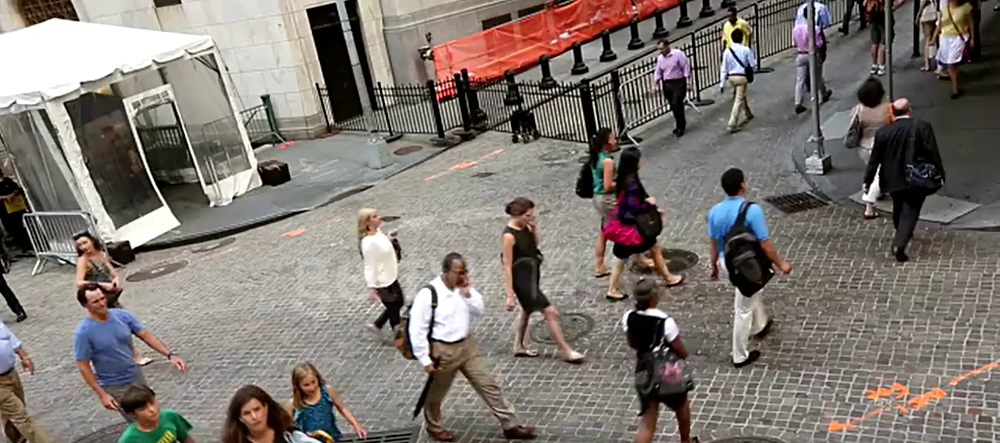

In [0]:
img = cv2.imread("frames/1.png")
cv2_imshow(img)

In [0]:
outputs = predictor(img)

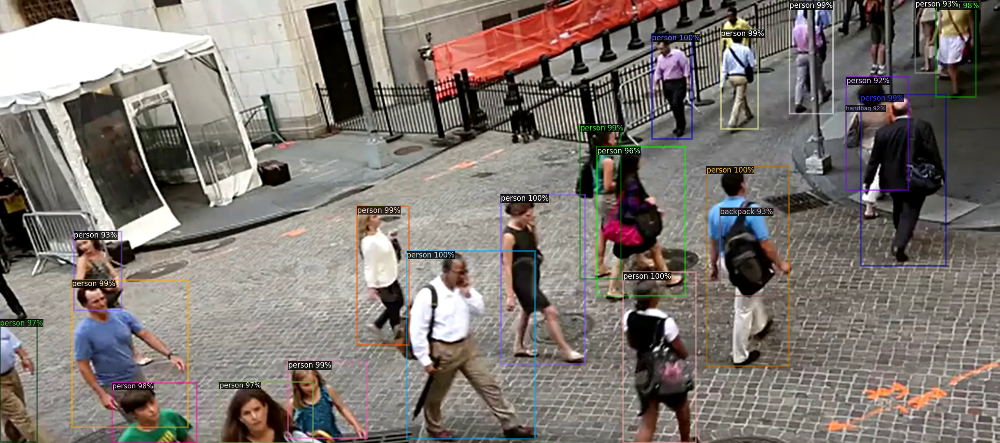

In [0]:
v = Visualizer(img, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(v.get_image())

In [0]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml'))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml')
predictor = DefaultPredictor(cfg)

model_final_9243eb.pkl: 144MB [00:15, 9.50MB/s]                           


In [0]:
#read an image
img = cv2.imread("frames/1.png")

#pass to the model
outputs = predictor(img)

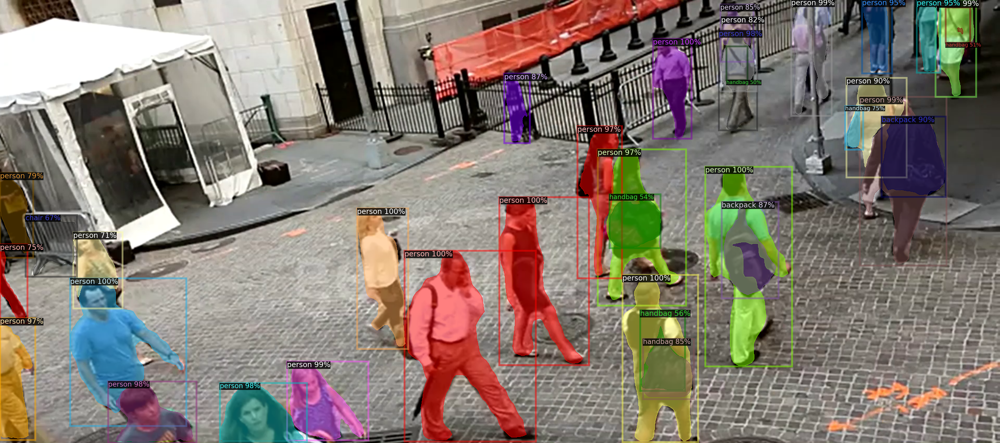

In [0]:
v = Visualizer(img, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=2)
v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
img=cv2_imshow(v.get_image())

In [0]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)



model_final_a6e10b.pkl: 237MB [01:38, 2.40MB/s]                           


In [0]:
#read an image
img = cv2.imread("frames/1.png")

#pass to the model
outputs = predictor(img)

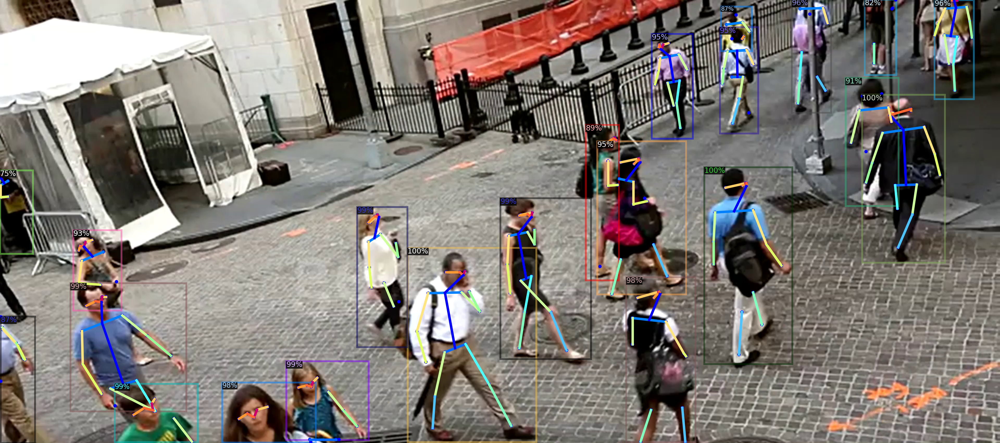

In [0]:
v = Visualizer(img, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=2)
v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
img=cv2_imshow(v.get_image())

In [0]:
print(cfg.DATASETS)

PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
PROPOSAL_FILES_TEST: ()
PROPOSAL_FILES_TRAIN: ()
TEST: ('keypoints_coco_2017_val',)
TRAIN: ('keypoints_coco_2017_train',)


In [0]:
print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))

Metadata(evaluator_type='coco', image_root='datasets/coco/train2017', json_file='datasets/coco/annotations/person_keypoints_train2017.json', keypoint_connection_rules=[('left_ear', 'left_eye', (102, 204, 255)), ('right_ear', 'right_eye', (51, 153, 255)), ('left_eye', 'nose', (102, 0, 204)), ('nose', 'right_eye', (51, 102, 255)), ('left_shoulder', 'right_shoulder', (255, 128, 0)), ('left_shoulder', 'left_elbow', (153, 255, 204)), ('right_shoulder', 'right_elbow', (128, 229, 255)), ('left_elbow', 'left_wrist', (153, 255, 153)), ('right_elbow', 'right_wrist', (102, 255, 224)), ('left_hip', 'right_hip', (255, 102, 0)), ('left_hip', 'left_knee', (255, 255, 77)), ('right_hip', 'right_knee', (153, 255, 204)), ('left_knee', 'left_ankle', (191, 255, 128)), ('right_knee', 'right_ankle', (255, 195, 77))], keypoint_flip_map=(('left_eye', 'right_eye'), ('left_ear', 'right_ear'), ('left_shoulder', 'right_shoulder'), ('left_elbow', 'right_elbow'), ('left_wrist', 'right_wrist'), ('left_hip', 'right_hi

In [0]:
bounding_box=outputs['instances'].pred_boxes.tensor.cpu().numpy()  #converting tensor to numpy array 
classes=outputs['instances'].pred_classes.cpu().numpy() 
print(bounding_box)
print(classes)
print(len(classes))   #number of objects present in image

[[7.8249634e+02 4.7710562e+02 1.0295941e+03 8.4983075e+02]
 [1.3522269e+03 3.2207401e+02 1.5210842e+03 7.0011206e+02]
 [1.6550254e+03 1.8259322e+02 1.8138782e+03 5.0555920e+02]
 [2.2021080e+02 7.3821973e+02 3.7926129e+02 8.5013477e+02]
 [9.6046423e+02 3.8152615e+02 1.1346902e+03 6.9059302e+02]
 [1.3517293e+02 5.4469641e+02 3.5756451e+02 7.9120392e+02]
 [6.8560779e+02 3.9861957e+02 7.8212531e+02 6.6763452e+02]
 [5.4942218e+02 6.9480994e+02 7.0756262e+02 8.4601990e+02]
 [1.2021313e+03 5.3356097e+02 1.3350099e+03 8.4993011e+02]
 [4.2668433e+02 7.3583997e+02 6.0605267e+02 8.5093500e+02]
 [1.5200609e+03 0.0000000e+00 1.5952877e+03 2.1724522e+02]
 [1.7939204e+03 8.9241105e-01 1.8696512e+03 1.9108087e+02]
 [1.1466959e+03 2.7198770e+02 1.3171248e+03 5.6635803e+02]
 [1.2510414e+03 6.6089005e+01 1.3298116e+03 2.6742996e+02]
 [1.3818691e+03 5.3190971e+01 1.4554905e+03 2.5725024e+02]
 [1.4061676e+02 4.4277679e+02 2.3293361e+02 5.9719897e+02]
 [1.6233545e+03 1.5055173e+02 1.7252037e+03 3.9636035e+0

In [0]:
#identifying only "person" in a particular frame

index_of_person=np.where(classes==0)[0]
person=bounding_box[index_of_person]
num= len(person)
print("total number of people in a particular frame = ",num)

total number of people in a particular frame =  22


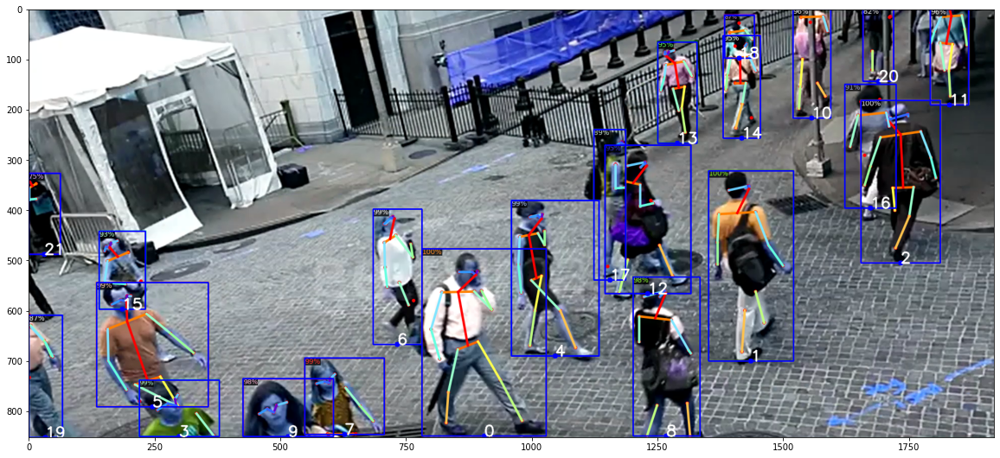

In [0]:
img = cv2.imread('frames/1.png')
v = Visualizer(img, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
img=v.get_image()
#define a function which return the bottom center of every bbox
def bottom_centre(img,person,idx):
  #get the coordinates
  x1,y1,x2,y2 = person[idx]
  _ = cv2.rectangle(img, (x1, y1), (x2, y2), (0,0,255), 2)
 
  mid=(int((x1+x2)/2),int(y2))
  
  _ = cv2.circle(img, mid, 5, (0, 0, 255), -1)
  cv2.putText(img, str(idx), mid, cv2.FONT_HERSHEY_SIMPLEX,1, (255, 255, 255), 2, cv2.LINE_AA)
  
  return mid

midpoints = [bottom_centre(img,person,i) for i in range(len(person))]
plt.figure(figsize=(20,10))
plt.imshow(img)


In [0]:
from scipy.spatial import distance
def calculate_distance(midpoints,num):
  dist = np.empty(shape=(num,num))
  for i in range(num):
    for j in range(i+1,num):
      if i!=j:
        dst = distance.euclidean(midpoints[i], midpoints[j])
        dist[i][j]=dst
  return dist

dist=calculate_distance(midpoints,num)

In [0]:
def closest_people(dist,num,thresh):
  p1=[]
  p2=[]
  d=[]
  for i in range(num):
    for j in range(i,num):
      if( (i!=j) & (dist[i][j]<=thresh)):
        p1.append(i)
        p2.append(j)
        d.append(dist[i][j])
  return p1,p2,d
thresh=100
p1,p2,d=closest_people(dist,num,thresh)

In [0]:
def change_bounding_box_color(img,person,p1,p2):
  very_close = np.unique(p1+p2)
  for i in very_close:
    x1,y1,x2,y2 = person[i]
    _ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)  
  return img
image=change_bounding_box_color(img,person,p1,p2)


In [0]:
import os
import re

names=os.listdir('frames/')
names.sort(key=lambda f: int(re.sub('\D', '', f)))

In [0]:
def find_closest_people_in_frame(name,thresh):

  img = cv2.imread('frames/'+name)
  outputs = predictor(img)
  classes=outputs['instances'].pred_classes.cpu().numpy()
  bounding_box=outputs['instances'].pred_boxes.tensor.cpu().numpy()
  index_of_person = np.where(classes==0)[0]
  person=bounding_box[index_of_person]
  v = Visualizer(img, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
  v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
  img=v.get_image()
  midpoints = [bottom_centre(img,person,i) for i in range(len(person))]
  num = len(midpoints)
  dist= calculate_distance(midpoints,num)
  p1,p2,d=closest_people(dist,num,thresh)
  image = change_bounding_box_color(img,person,p1,p2)
  
  cv2.imwrite('frames/'+name,img)
  return 0

In [0]:

from tqdm import tqdm
thresh=100
_ = [find_closest_people_in_frame(names[i],thresh) for i in tqdm(range(len(names))) ]

100%|██████████| 1103/1103 [11:12<00:00,  1.64it/s]


In [0]:
frames = os.listdir('frames/')
frames.sort(key=lambda f: int(re.sub('\D', '', f)))

frame_array=[]

for i in range(len(frames)):
    
    #reading each files
    img = cv2.imread('frames/'+frames[i])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    height, width, layers = img.shape
    size = (width,height)
    
    #inserting the frames into an image array
    frame_array.append(img)

out = cv2.VideoWriter('project_video_output-final_.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 25, size)
 
for i in range(len(frame_array)):
    # writing to a image array
    out.write(frame_array[i])
out.release()